In [1]:
%load_ext autoreload

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import matplotlib.colors as colors
import matplotlib
from time import time 
import os

In [2]:
%autoreload 

from DDFNN.dffnn import fastVel

In [3]:
def readdotflo(dir_file):
    with open(dir_file, 'rb') as f:
        magic = np.fromfile(f, np.float32, count=1)
        if 202021.25 != magic:
            print('Magic number incorrect. Invalid .flo file')
        else:
            w = np.fromfile(f, np.int32, count=1)[0]
            h = np.fromfile(f, np.int32, count=1)[0]
            data = np.fromfile(f, np.float32, count=2*w*h)
            # Reshape data into 3D array (columns, rows, bands)
            data2D = np.resize(data, (h, w, 2))
    return data2D

def readtif(dir_file):
    return plt.imread(dir_file)/255

In [4]:
main_path = "examples/example 1/"
files = os.listdir(main_path)
files_full_path = [os.path.join(main_path, file_path) for file_path in files]
dataset = {"_".join(files[i].split("_")[:-2]):{"truth":files_full_path[i], "img1":files_full_path[i+1], "img2":files_full_path[i+2]} for i in range(0, len(files), 3)}

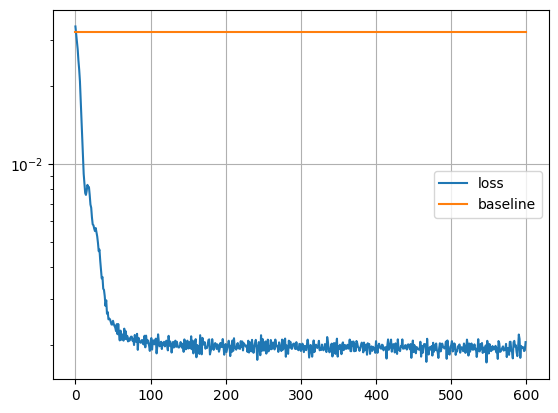

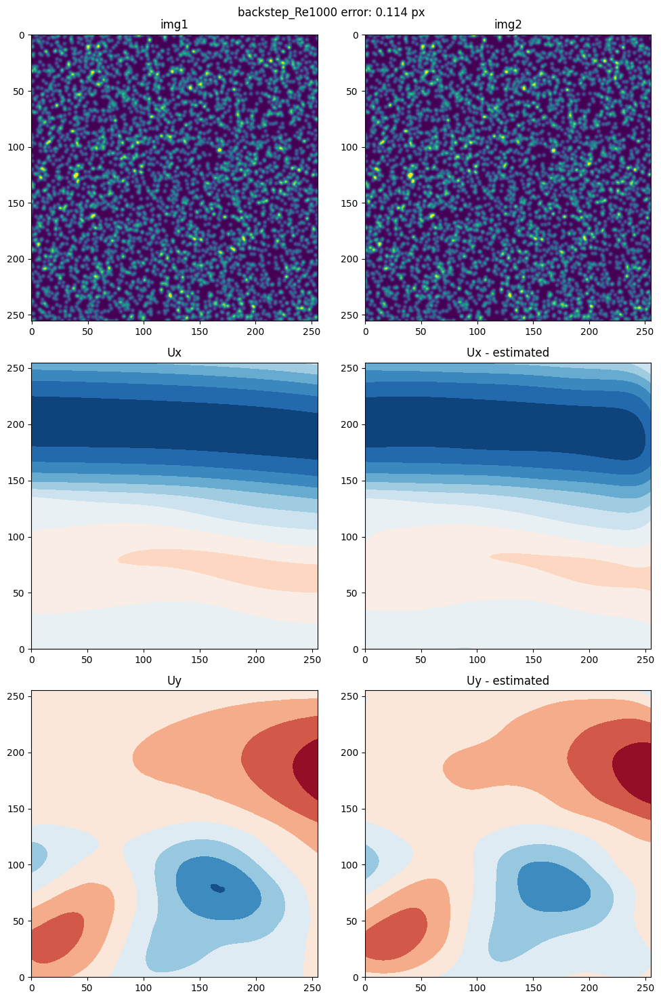

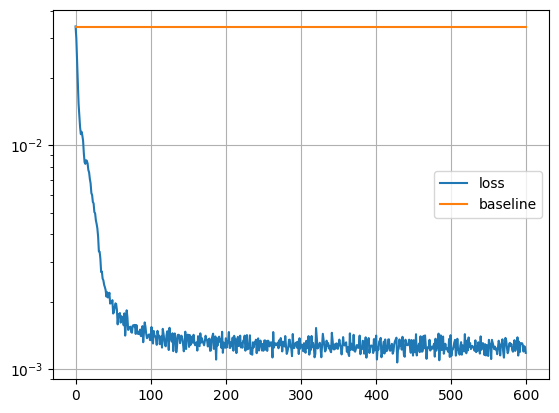

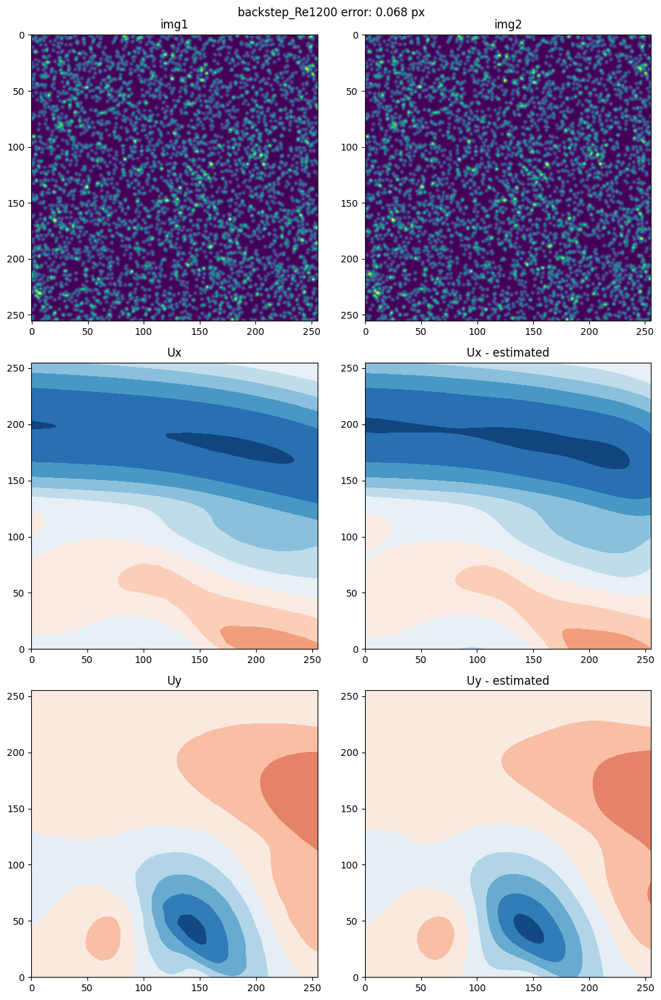

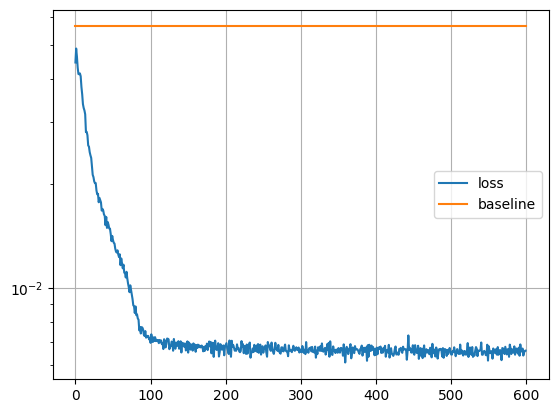

...

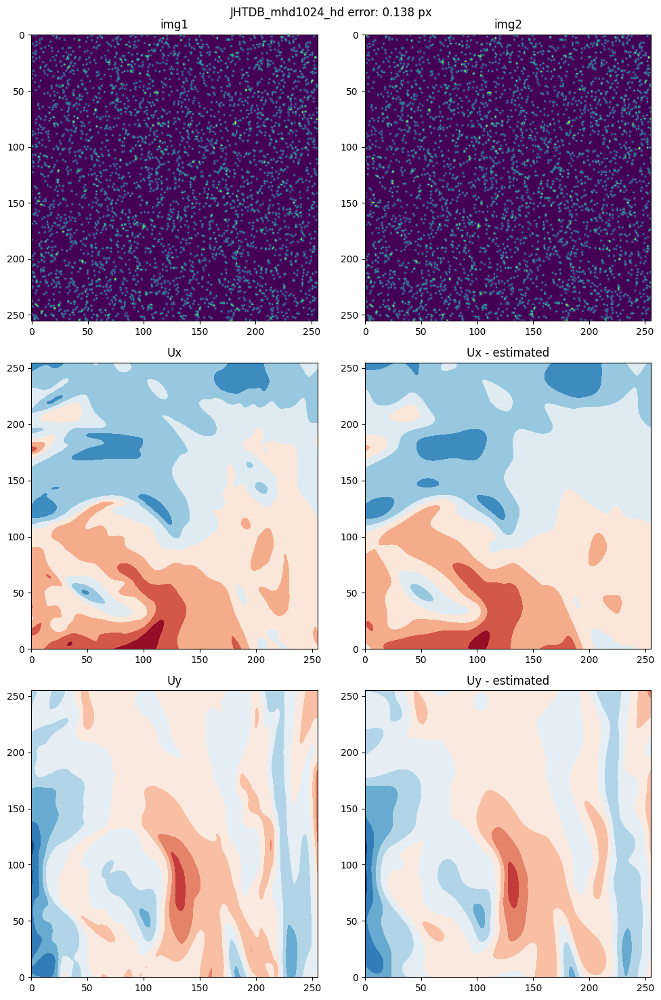

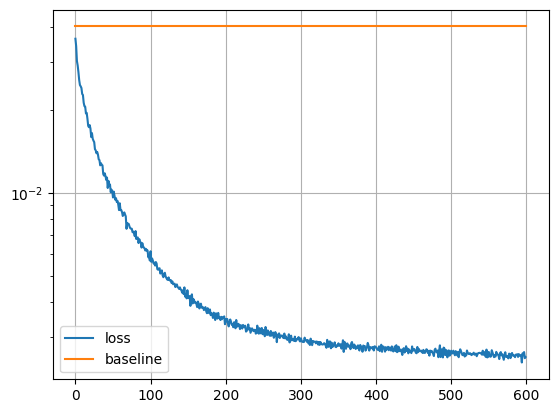

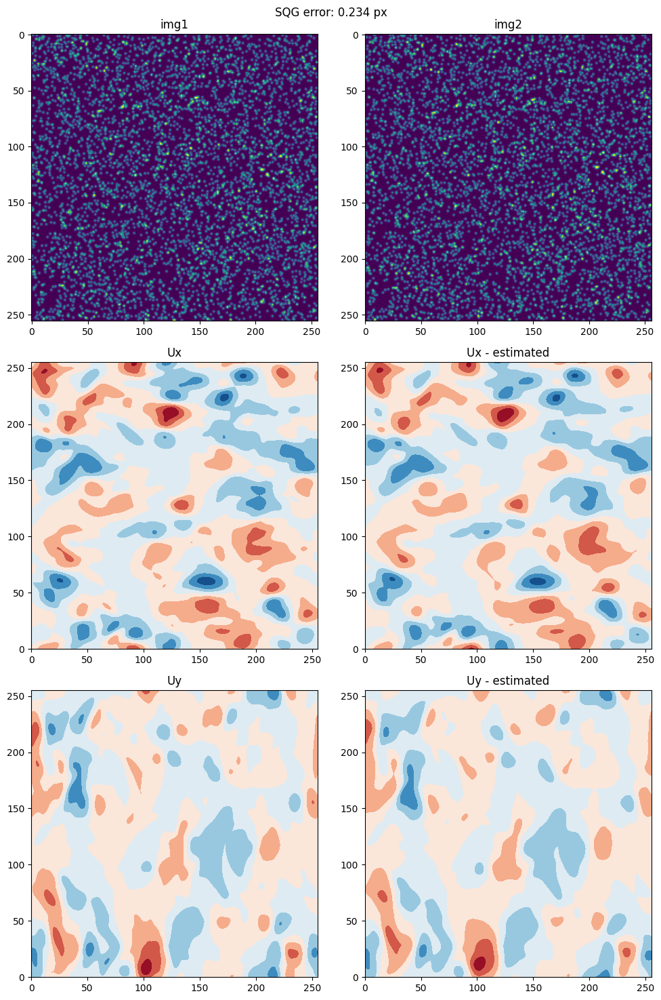

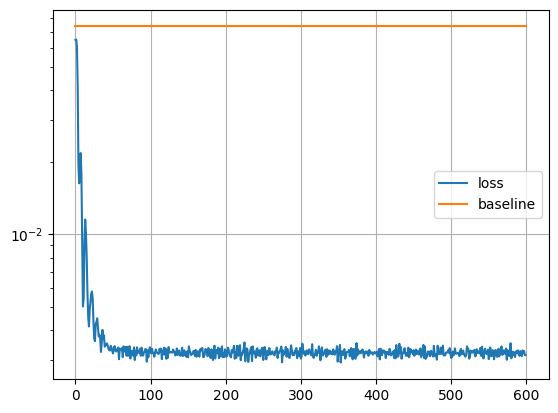

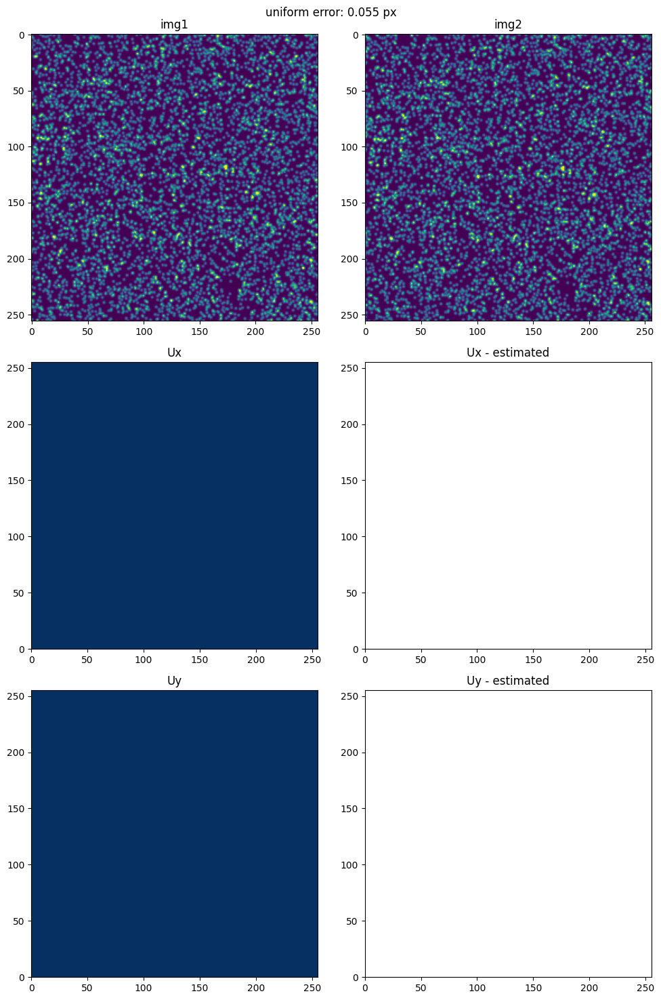

In [5]:
betas = {
    'backstep_Re1000':100, 
    'backstep_Re1200':100, 
    'backstep_Re1500':100, 
    'backstep_Re800':100, 
    'cylinder_Re150':50, 
    'cylinder_Re200':50, 
    'cylinder_Re300':50, 
    'cylinder_Re400':50, 
    'cylinder_Re40':100, 
    'DNS_turbulence':10, 
    'JHTDB_channel_hd':30, 
    'JHTDB_isotropic1024_hd':20, 
    'JHTDB_mhd1024_hd':50, 
    'SQG':20, 
    'uniform':200}

params = {
    "random_seed": 123,
    "nB":200,
    "nlayers":1,
    "sizelayer":100, 
    "lamb":[0, 0],
    "its":200,#00*10,
    "batch_size":20000,
    "lr":1e-3,
    "tr":0.0,
    }
for case in dataset.keys():
    img1 = readtif(dataset[case]["img1"])
    img2 = readtif(dataset[case]["img2"])
    flow = readdotflo(dataset[case]["truth"])
    x = np.arange(img1.shape[0])
    y = np.arange(img1.shape[1])
    X, Y = np.meshgrid(y, x[::-1])

    params["scaler"] = betas[case]
    _, _, vel = fastVel(img1, img2, verbose= True, **params)
    Ux = vel[:,0].reshape(img1.shape)[::-1]
    Uy = -vel[:,1].reshape(img1.shape)[::-1]
    
    error = np.sqrt(np.mean(((Ux-flow[:,:,0])**2+(Uy+flow[:,:,1])**2)))
    
    plt.figure(figsize=(10,15))
    plt.suptitle(case+f" error: {error:.3f} px")
    plt.subplot(321)
    plt.title("img1")
    plt.imshow(img1[::-1])
    plt.subplot(322)
    plt.title("img2")
    plt.imshow(img2[::-1])
    plt.subplot(323)
    plt.title("Ux")
    lev = plt.contourf(X, Y, flow[:,:,0], cmap="RdBu", norm=colors.CenteredNorm(0))
    plt.axis("scaled")
    plt.subplot(324)
    plt.title("Ux - estimated")
    plt.contourf(X, Y, Ux, levels=lev.levels, cmap="RdBu", norm=colors.CenteredNorm(0))
    plt.axis("scaled")
    plt.subplot(325)
    plt.title("Uy")
    lev = plt.contourf(X, Y, -flow[:,:,1], cmap="RdBu", norm=colors.CenteredNorm(0))
    plt.axis("scaled")
    plt.subplot(326)
    plt.title("Uy - estimated")
    plt.contourf(X, Y, Uy, levels=lev.levels, cmap="RdBu", norm=colors.CenteredNorm(0))
    plt.axis("scaled")
    plt.tight_layout()
    plt.show()